### INTRODUCTION
* Extraction of features is a very important part in analyzing and finding relations between different things. The data provided of audio cannot be understood by the models directly to convert them into an understandable format feature extraction is used. It is a process that explains most of the data but in an understandable way. Feature extraction is required for classification, prediction and recommendation algorithms.

### PACKAGES TO BE USED
* We’ll be using librosa for analyzing and extracting features of an audio signal. For playing audio we will use pyAudio so that we can play music on jupyter directly.

In [1]:
import os
import random

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg
plt.style.use('fivethirtyeight')
sns.set_style('whitegrid')

import librosa
import librosa.display
import IPython.display as ipd

import sklearn
from sklearn.preprocessing import minmax_scale

import warnings
warnings.filterwarnings('ignore')

In [2]:
train_folder = '../input/birdsong-recognition/train_audio'
birds = [path for path in os.listdir(os.path.join(train_folder))][-5:]

In [3]:
sample_sound = {}

for i,bird in enumerate(birds):
    folder = os.path.join(train_folder, bird)
    for path in os.listdir(os.path.join(folder)):
        #get 1 sample sound per bird
        sample_sound[bird] = os.path.join(folder, path)
        break

In [4]:
sample_sound

{'juntit1': '../input/birdsong-recognition/train_audio/juntit1/XC293943.mp3',
 'camwar': '../input/birdsong-recognition/train_audio/camwar/XC241873.mp3',
 'rudduc': '../input/birdsong-recognition/train_audio/rudduc/XC483784.mp3',
 'lesyel': '../input/birdsong-recognition/train_audio/lesyel/XC161330.mp3',
 'calgul': '../input/birdsong-recognition/train_audio/calgul/XC189398.mp3'}

### LET'S HEAR SOME BIRDS

In [5]:
print(birds[0], ' sample sound.')
ipd.Audio(sample_sound[birds[0]])

juntit1  sample sound.


In [6]:
print(birds[1], ' sample sound.')
ipd.Audio(sample_sound[birds[1]])

camwar  sample sound.


In [7]:
print(birds[2], ' sample sound.')
ipd.Audio(sample_sound[birds[2]])

rudduc  sample sound.


In [8]:
print(birds[3], ' sample sound.')
ipd.Audio(sample_sound[birds[3]])

lesyel  sample sound.


In [9]:
print(birds[4], ' sample sound.')
ipd.Audio(sample_sound[birds[4]])

calgul  sample sound.


### LOAD THE SAMPLES AND CHECK INFO.

In [10]:
sound_data = {}

for i, val in enumerate(sample_sound.values()):
    y, sr = librosa.load(val)
    sound_data[birds[i]] = {'y':y, 'sr': sr}

In [11]:
sound_data

{'juntit1': {'y': array([-7.8397820e-04, -8.2208175e-04, -6.4081780e-04, ...,
          1.3721221e-04, -6.1273051e-05,  0.0000000e+00], dtype=float32),
  'sr': 22050},
 'camwar': {'y': array([ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
          2.4430148e-04,  6.5377208e-05, -4.9546245e-05], dtype=float32),
  'sr': 22050},
 'rudduc': {'y': array([ 0.00154508,  0.00190557,  0.00172057, ..., -0.0072892 ,
         -0.00700524,  0.        ], dtype=float32),
  'sr': 22050},
 'lesyel': {'y': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
  'sr': 22050},
 'calgul': {'y': array([ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
          1.5599990e-05, -1.4455122e-04,  0.0000000e+00], dtype=float32),
  'sr': 22050}}

In [12]:
for i in range(len(birds)):
    print('X shape: ', sound_data[birds[i]]['y'].shape)
    print('Sampling Rate (KHz): ', sound_data[birds[i]]['sr'])
    print('='*50)

X shape:  (8102576,)
Sampling Rate (KHz):  22050
X shape:  (889920,)
Sampling Rate (KHz):  22050
X shape:  (321392,)
Sampling Rate (KHz):  22050
X shape:  (663617,)
Sampling Rate (KHz):  22050
X shape:  (651446,)
Sampling Rate (KHz):  22050


### FEATURE EXTRACTION AND VISUALIZATION
---

### SOUNDWAVES
* Waveplots let us know the loudness of the audio at a given time.

In [13]:
#function to generate random color
def gen_color():
    color = "%06x" % random.randint(0, 0xFFFFFF)
    color = '#'+ color
    return color

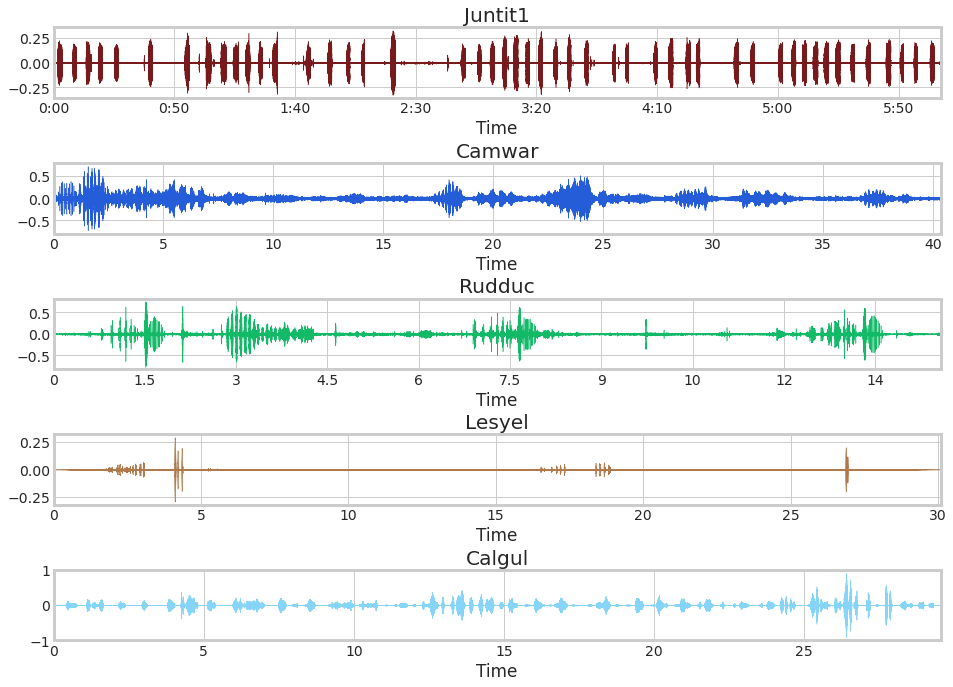

In [14]:
fig, ax = plt.subplots(len(birds),1,figsize=(14,10))
plt.tight_layout(3)

for i in range(len(birds)):
    librosa.display.waveplot(y = sound_data[birds[i]]['y'],
                             sr = sound_data[birds[i]]['sr'],
                             ax = ax[i], color = gen_color())
    ax[i].set_title(birds[i].capitalize())


### SPECTOGRAM
* A spectrogram is a visual representation of the spectrum of frequencies of sound or other signals as they vary with time. It’s a representation of frequencies changing with respect to time for given music signals.

In [15]:
for i in range(len(birds)):
    #perform a short fourier transform on signal amplitude
    sound_data[birds[i]]['stft'] = librosa.stft(sound_data[birds[i]]['y'])
    # convert to db
    sound_data[birds[i]]['ydb'] = librosa.amplitude_to_db(abs(sound_data[birds[i]]['stft']))

*  STFT(Short Time Fourier Transform) converts signal such that we can know the amplitude of given frequency at a given time. Using STFT we can determine the amplitude of various frequencies playing at a given time of an audio signal. 

In [16]:
#show data
sound_data[birds[1]]

{'y': array([ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         2.4430148e-04,  6.5377208e-05, -4.9546245e-05], dtype=float32),
 'sr': 22050,
 'stft': array([[-1.55525863e-01+0.00000000e+00j, -2.05396861e-01+0.00000000e+00j,
         -1.29152536e-01+0.00000000e+00j, ...,
          1.43695613e-02+0.00000000e+00j,  6.81833103e-02+0.00000000e+00j,
          1.09584697e-01+0.00000000e+00j],
        [-4.15810049e-02-3.89635156e-17j,  2.00107530e-01-5.26001789e-02j,
          3.06364689e-02+1.29060522e-01j, ...,
          7.18585262e-03+1.11979656e-02j, -4.73115630e-02+4.11275402e-02j,
         -5.57187088e-02+1.20025456e-04j],
        [ 1.35416627e-01+1.95734342e-17j, -1.82054505e-01+1.03922576e-01j,
          1.16557702e-01-6.69893548e-02j, ...,
         -3.83044453e-03+1.01454109e-02j,  1.16265239e-02-5.67020141e-02j,
         -4.17453945e-02+2.71972008e-02j],
        ...,
        [-7.45122134e-06-1.71881894e-17j,  1.89239654e-05+4.63045348e-04j,
         -2.08844664e-04-8.0492

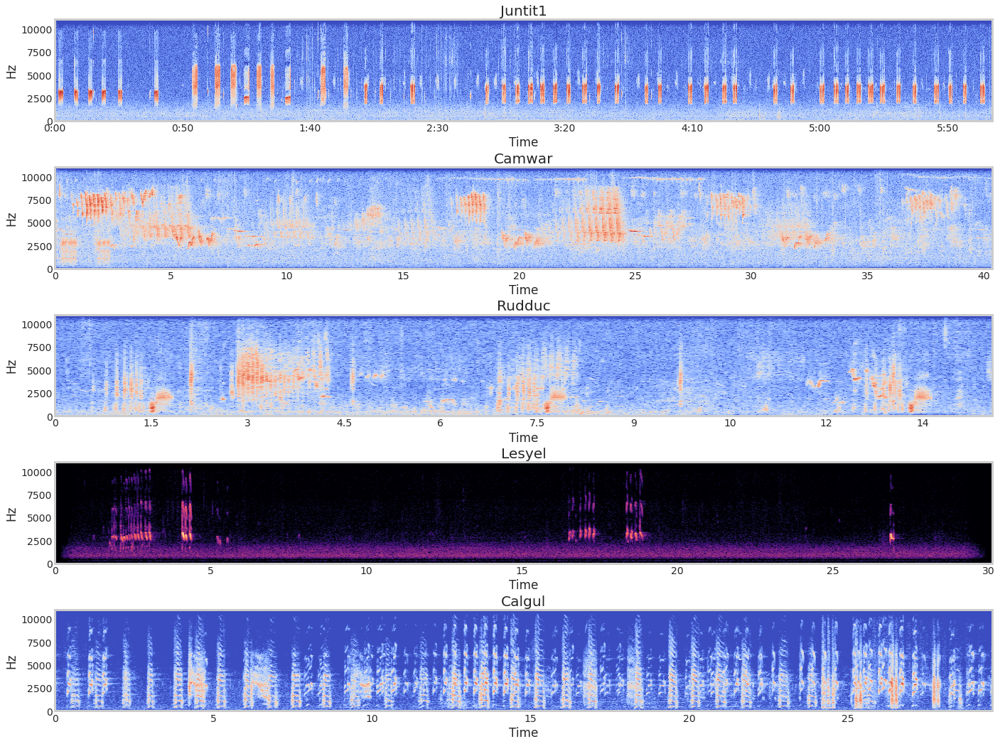

In [17]:
fig, ax = plt.subplots(len(birds),1,figsize=(20,15))
plt.tight_layout(3)

for i in range(len(birds)):
    librosa.display.specshow(sound_data[birds[i]]['ydb'],
                             sr = sound_data[birds[i]]['sr'],
                             x_axis='time', y_axis='hz',
                             ax = ax[i])
    ax[i].set_title(birds[i].capitalize())

### ZERO CROSSING RATE
* The zero crossing rate is the rate of sign-changes along a signal, i.e., the rate at which the signal changes from positive to negative or back. This feature has been used heavily in both speech recognition and music information retrieval.

In [18]:
for i in range(len(birds)):
    sound_data[birds[i]]['zcr'] = librosa.zero_crossings(sound_data[birds[i]]['y'], pad=False).sum()

In [19]:
for i in range(len(birds)):
    print(birds[i].capitalize(), 'Zero Crossing Rate: ', sound_data[birds[i]]['zcr'])

Juntit1 Zero Crossing Rate:  1479057
Camwar Zero Crossing Rate:  373775
Rudduc Zero Crossing Rate:  82804
Lesyel Zero Crossing Rate:  84818
Calgul Zero Crossing Rate:  144248


### SPECTRAL CENTROID
*  If the frequencies in music are same throughout then spectral centroid would be around a centre and if there are high frequencies at the end of sound then the centroid would be towards its end.

In [20]:
for i in range(len(birds)):
    sound_data[birds[i]]['spec_c'] = librosa.feature.spectral_centroid(sound_data[birds[i]]['y'], sr= sound_data[birds[i]]['sr'])[0]
    frames = range(len(sound_data[birds[i]]['spec_c']))
    sound_data[birds[i]]['t_frame'] = librosa.frames_to_time(frames)

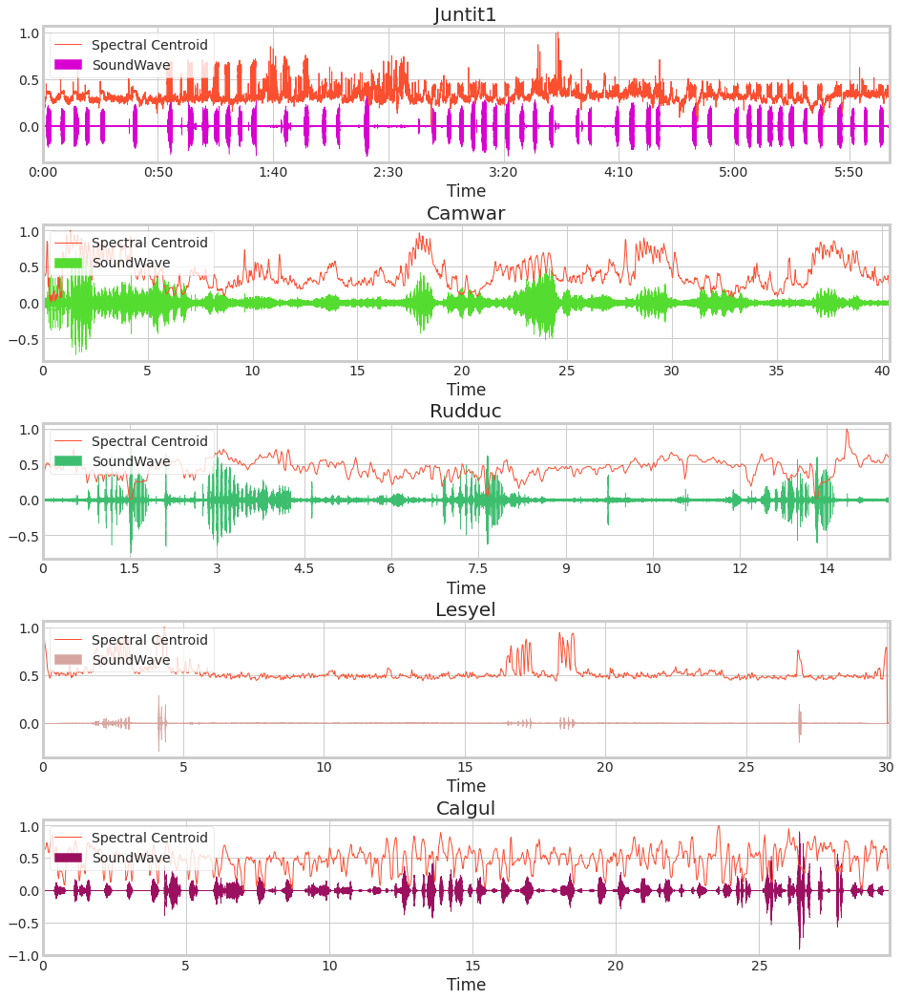

In [21]:
fig, ax = plt.subplots(len(birds),1,figsize=(14,15))
plt.tight_layout(3)

for i in range(len(birds)):
    librosa.display.waveplot(y = sound_data[birds[i]]['y'],
                             sr = sound_data[birds[i]]['sr'],
                             ax = ax[i], color = gen_color())
    # Normalising the spectral centroid for visualisation
    ax[i].plot(sound_data[birds[i]]['t_frame'], minmax_scale(sound_data[birds[i]]['spec_c'], axis=0), lw=1)
    ax[i].set_title(birds[i].capitalize())
    ax[i].legend(['Spectral Centroid', 'SoundWave'], loc ='upper left');

### SPECTRAL ROLLOFF
* Spectral rolloff is the frequency below which a specified percentage of the total spectral energy, e.g. 85%, lies.

In [22]:
for i in range(len(birds)):
    sound_data[birds[i]]['spec_r'] = librosa.feature.spectral_rolloff(sound_data[birds[i]]['y'], sr= sound_data[birds[i]]['sr'])[0]
    frames = range(len(sound_data[birds[i]]['spec_r']))
    sound_data[birds[i]]['tr_frame'] = librosa.frames_to_time(frames)

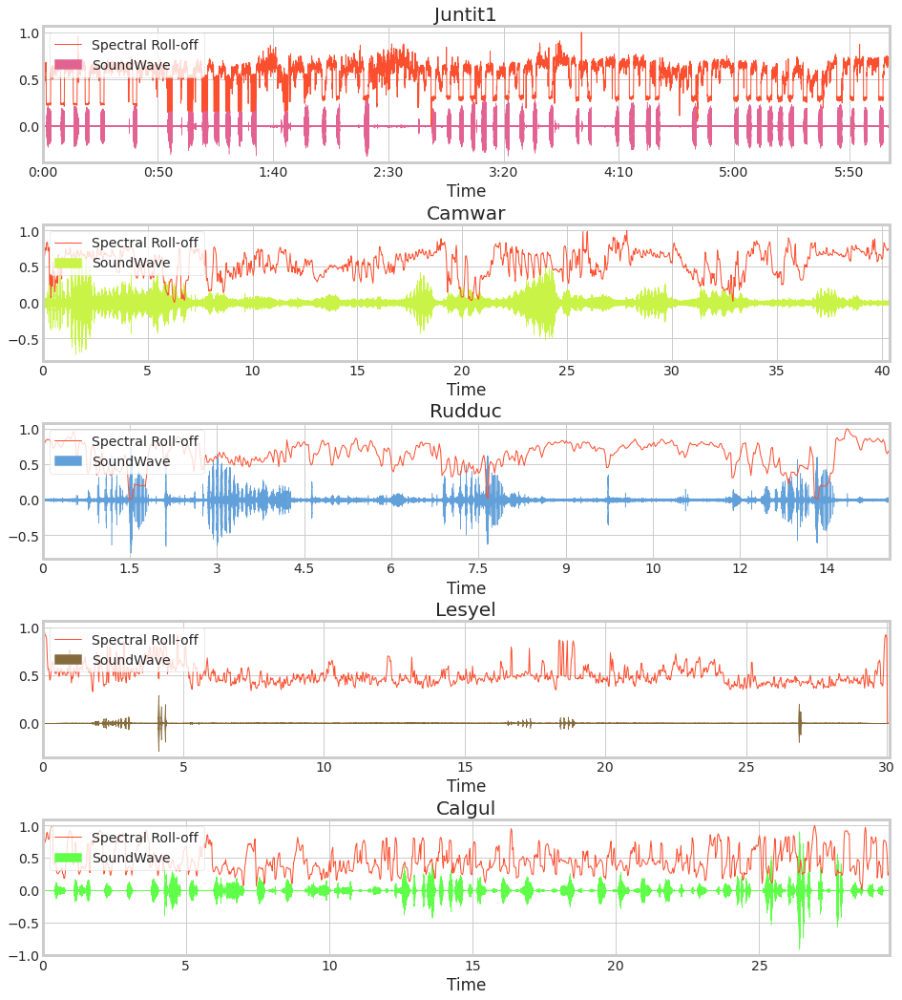

In [23]:
fig, ax = plt.subplots(len(birds),1,figsize=(14,15))
plt.tight_layout(3)

for i in range(len(birds)):
    librosa.display.waveplot(y = sound_data[birds[i]]['y'],
                             sr = sound_data[birds[i]]['sr'],
                             ax = ax[i], color = gen_color())
    # Normalising the spectral centroid for visualisation
    ax[i].plot(sound_data[birds[i]]['tr_frame'], minmax_scale(sound_data[birds[i]]['spec_r'], axis=0), lw=1)
    ax[i].set_title(birds[i].capitalize())
    ax[i].legend(['Spectral Roll-off', 'SoundWave'], loc ='upper left');

### BPM

In [24]:
for i in range(len(birds)):
    sound_data[birds[i]]['bpm'] = librosa.beat.beat_track(sound_data[birds[i]]['y'], sr=sound_data[birds[i]]['sr'])[0]
    print(birds[i],' BPM: ',sound_data[birds[i]]['bpm'])

juntit1  BPM:  129.19921875
camwar  BPM:  117.45383522727273
rudduc  BPM:  135.99917763157896
lesyel  BPM:  135.99917763157896
calgul  BPM:  89.10290948275862


### HARMONICS AND PERCEPTUAL

*  Harmonics - Partial tones that are whole multiples of the fundamental frequency.
*  Perceptrual shock wave -  Represents the sound rhythm and emotion.

In [25]:
for i in range(len(birds)):
    sound_data[birds[i]]['y_harm'], sound_data[birds[i]]['y_perc'] = librosa.effects.hpss(sound_data[birds[i]]['y'])

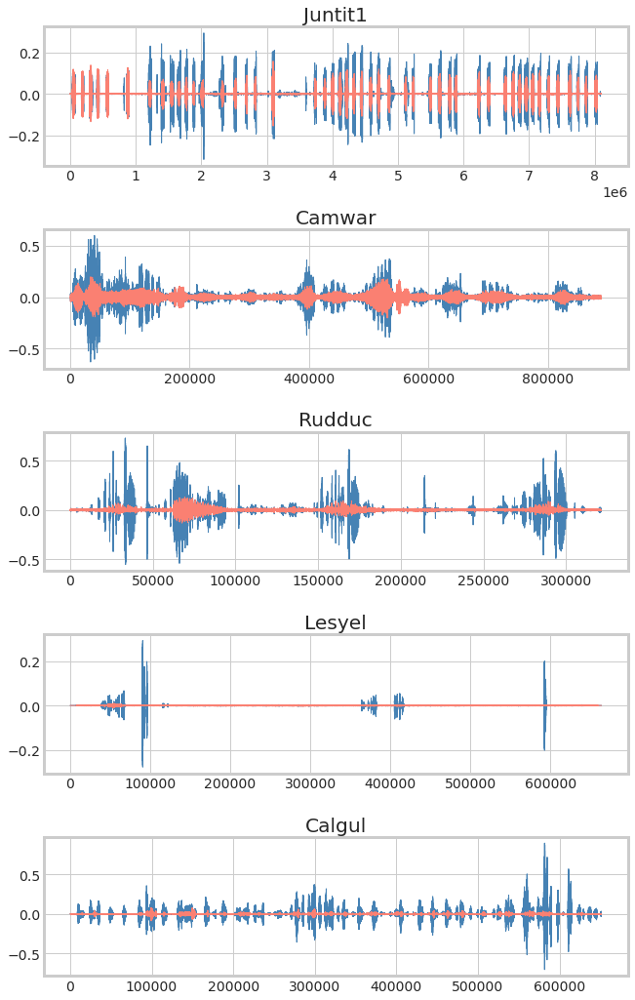

In [26]:
fig, ax = plt.subplots(len(birds),1, figsize=(10,15))
plt.tight_layout(3)
for i in range(len(birds)):
    ax[i].set_title(birds[i].capitalize())
    ax[i].plot(sound_data[birds[i]]['y_perc'], color= 'steelblue', lw=1);
    ax[i].plot(sound_data[birds[i]]['y_harm'], color= 'salmon', lw=1);


### CHROMA FREQUENCIES
*  Chroma-based features are a powerful tool for analyzing music whose pitches can be meaningfully categorized (often into twelve categories) and whose tuning approximates to the equal-tempered scale. One main property of chroma features is that they capture harmonic and melodic characteristics of music, while being robust to changes in timbre and instrumentation.

In [27]:
for i in range(len(birds)):
    base =  sound_data[birds[i]]
    base['ch_fr'] = librosa.feature.chroma_stft(base['y'], sr = base['sr'])
    print(birds[i], ' Chromogram Shape: ', base['ch_fr'].shape)

juntit1  Chromogram Shape:  (12, 15826)
camwar  Chromogram Shape:  (12, 1739)
rudduc  Chromogram Shape:  (12, 628)
lesyel  Chromogram Shape:  (12, 1297)
calgul  Chromogram Shape:  (12, 1273)


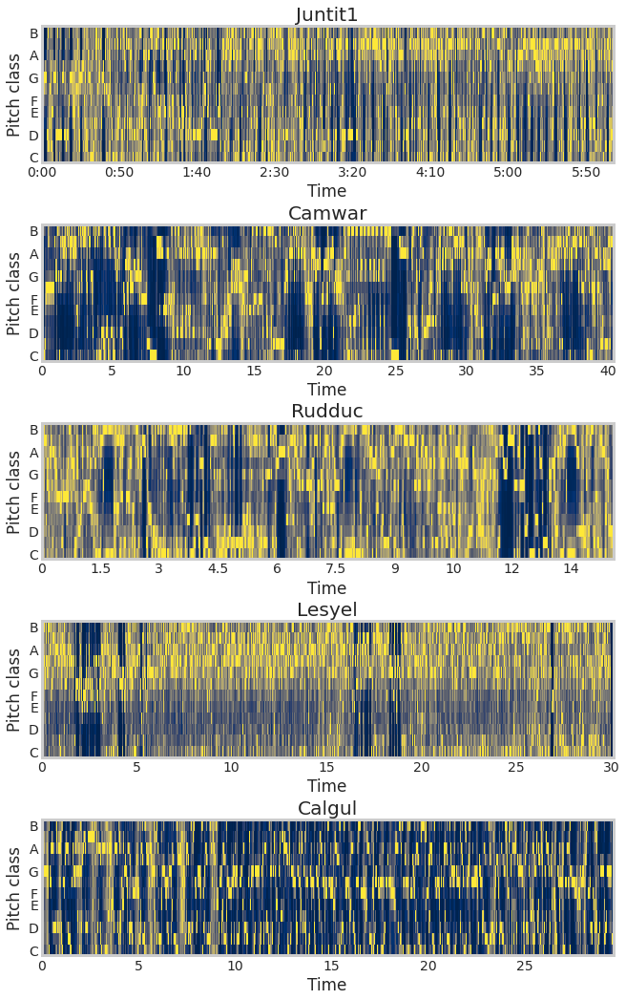

In [28]:
fig, ax = plt.subplots(len(birds), 1 , figsize=(10,15))
plt.tight_layout(3)

for i in range(len(birds)):
    ax[i].set_title(birds[i].capitalize())
    librosa.display.specshow(sound_data[birds[i]]['ch_fr'], x_axis='time', y_axis='chroma', cmap='cividis', ax = ax[i])

### MFCC
* The mel frequency cepstral coefficients (MFCCs) of a signal are a small set of features (usually about 10–20) which concisely describe the overall shape of a spectral envelope.

In [29]:
for i in range(len(birds)):
    base =  sound_data[birds[i]]
    base['mfcc'] = librosa.feature.mfcc(base['y'], sr = base['sr'])
    print(birds[i], ' MFCC Shape: ', base['mfcc'].shape)

juntit1  MFCC Shape:  (20, 15826)
camwar  MFCC Shape:  (20, 1739)
rudduc  MFCC Shape:  (20, 628)
lesyel  MFCC Shape:  (20, 1297)
calgul  MFCC Shape:  (20, 1273)


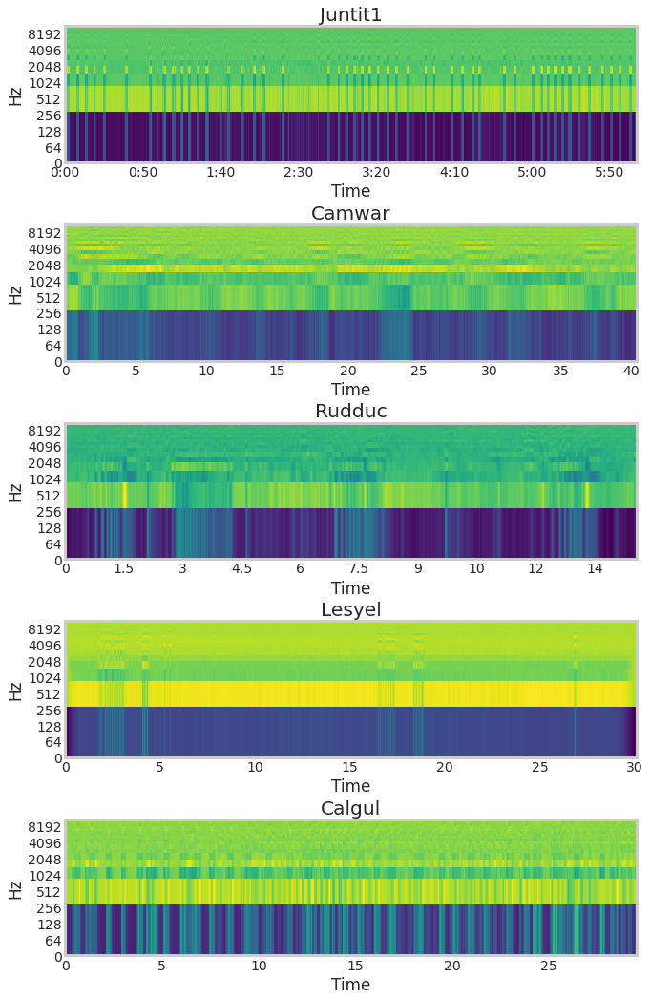

In [30]:
fig, ax = plt.subplots(len(birds), 1 , figsize=(10,15))
plt.tight_layout(3)

for i in range(len(birds)):
    ax[i].set_title(birds[i].capitalize())
    librosa.display.specshow(sound_data[birds[i]]['mfcc'], x_axis='time', y_axis='log', cmap='viridis', ax = ax[i])

### REFERENCE
* https://towardsdatascience.com/how-to-apply-machine-learning-and-deep-learning-methods-to-audio-analysis-615e286fcbbc
* https://en.wikipedia.org